# Face Autoencoder Training Notebook

Use this notebook to configure, train, and analyze the face autoencoder end-to-end. It exposes the same modules the CLI used, but keeps the entire workflow inline so you can iterate interactively while artifacts are written to `projects/face_autoencoder/artifacts/`.

## 1. Environment Setup
Add the repository root to `sys.path` so we can import the reusable training modules.

In [1]:
from pathlib import Path
import sys


def find_repo_root(start: Path) -> Path:
    for path in [start] + list(start.parents):
        if (path / '.git').exists():
            return path
    return start

repo_root = find_repo_root(Path.cwd().resolve())
if str(repo_root) not in sys.path:
    sys.path.append(str(repo_root))
print(f'Repo root: {repo_root}')


Repo root: /home/aghasi/repos/pa-academy-ai-2025


## 2. Imports
Bring in PyTorch, FastAI callbacks, and the project helpers (data loading, model, visualization, etc.).

In [2]:
from datetime import datetime, timezone
import json

import numpy as np
import torch
from fastai.callback.progress import CSVLogger
from fastai.callback.tracker import SaveModelCallback
from fastai.learner import Learner

from projects.face_autoencoder.src import data as data_utils
from projects.face_autoencoder.src.config import ARTIFACT_DIR, DEFAULTS
from projects.face_autoencoder.src.model import ConvVAE, VAELoss, PerceptualVAELoss, HybridVAELoss
from projects.face_autoencoder.src.training_utils import (
    reconstruction_mse,
    collect_latents,
    seed_everything,
    InlineReconstructionCallback,
)
from projects.face_autoencoder.src.visualize import (
    plot_training_curves,
    plot_latent_traversal,
    plot_reconstruction_grid,
)


## 3. Configure the run
Adjust any of these hyperparameters (latent dimension, resolution, epochs, etc.) before training.

In [3]:
# Hyperparameters (feel free to tweak)
epochs = 500
batch_size = 64
latent_dim = 64
lr = 2e-3  # Initial learning rate
beta = 1.0
pca_components = 8
image_size = 96
lfw_resize = 1.0
seed = 42


# Loss function selection: 'mse', 'log_mse', 'perceptual', or 'hybrid'
# - 'mse': Standard MSE reconstruction loss (fast, can be blurry)
# - 'log_mse': Log(MSE) loss (often sharper than MSE, good balance)
# - 'perceptual': VGG-based perceptual loss (best quality, slower)
# - 'hybrid': Log(MSE) + Perceptual loss (recommended default - best of both)
loss_type = 'log_mse'  # Default: combines log(MSE) + perceptual loss

run_id = datetime.now(timezone.utc).strftime('%Y%m%d-%H%M%S')
run_dir = ARTIFACT_DIR / run_id
run_dir.mkdir(parents=True, exist_ok=True)
history_path = run_dir / 'history.csv'

print(f'Artifacts will be written to: {run_dir}')
print(f'Loss function: {loss_type}')


Artifacts will be written to: /home/aghasi/repos/pa-academy-ai-2025/projects/face_autoencoder/artifacts/20251130-150833
Loss function: log_mse


## 4. Build the dataloaders
This step downloads (if needed) LFW, applies resizing/normalization, and creates FastAI `DataLoaders`.

In [4]:
seed_everything(seed)
dls, info = data_utils.create_dataloaders(
    batch_size=batch_size,
    image_size=image_size,
    num_workers=DEFAULTS['num_workers'],
    seed=seed,
    lfw_resize=lfw_resize,
)
reference_batch = next(iter(dls.valid))[0]
print(f"Dataset: {info.num_samples} samples | raw size {info.height}x{info.width} | channels {info.num_channels}")


Dataset: 13233 samples | raw size 125x94 | channels 3


## 5. Create Loss Function
Select and configure the loss function based on `loss_type` parameter.

In [5]:
# Helper function to create loss based on loss_type
def create_loss_function(loss_type: str, beta: float = 1.0):
    """Create VAE loss function based on type.
    
    Args:
        loss_type: 'mse', 'log_mse', 'perceptual', or 'hybrid'
        beta: Weight for KL divergence term
    """
    if loss_type == 'mse':
        return VAELoss(beta=beta, use_log_mse=False)
    elif loss_type == 'log_mse':
        return VAELoss(beta=beta, use_log_mse=True)
    elif loss_type == 'perceptual':
        return PerceptualVAELoss(
            beta=beta,
            perceptual_weight=1.0,
            mse_weight=0.3,  # Optional: small MSE for stability
            feature_layer='relu3_3'  # VGG layer (relu3_3 best for faces)
        )
    elif loss_type == 'hybrid':
        return HybridVAELoss(
            beta=beta,
            log_mse_weight=1.0,  # Weight for log(MSE) component
            perceptual_weight=0.3,  # Weight for perceptual component
            tv_weight=0.0001,  # Weight for TV loss (reduces artifacts)
            feature_layer='relu3_3'  # VGG layer (relu3_3 best for faces)
        )
    else:
        raise ValueError(f"Unknown loss_type: {loss_type}. Use 'mse', 'log_mse', 'perceptual', or 'hybrid'")

# Create the loss function
loss_func = create_loss_function(loss_type, beta=beta)
print(f'Created {loss_type} loss function with beta={beta}')

model = ConvVAE(
    latent_dim=latent_dim,
    image_channels=info.num_channels,
    image_size=image_size,
)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
learn = Learner(
    dls,
    model,
    loss_func=loss_func,
    metrics=[reconstruction_mse],
    path=run_dir,
    model_dir='.',
    cbs=[
        SaveModelCallback(monitor='valid_loss', fname='model'),
        CSVLogger(fname=history_path.name),
        InlineReconstructionCallback(reference_batch=reference_batch),
    ],
)
learn.to(device)
print(f'Training on device: {device}')


Created log_mse loss function with beta=1.0
Training on device: cuda


In [6]:
model

ConvVAE(
  (encoder_cnn): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReL

## 6. Train!
Train the model with the selected learning rate scheduler. The custom callback will save per-epoch reconstructions and loss plots under the run directory.

epoch,train_loss,valid_loss,recon_mse,time
0,-2.146859,-2.350904,0.081853,00:01
1,-2.476630,-2.545122,0.063720,00:01
2,-2.596094,-2.647550,0.055957,00:01
3,-2.674565,-2.710395,0.051203,00:01
4,-2.719064,-2.759696,0.047010,00:01
5,-2.747041,-2.778202,0.045596,00:01
6,-2.789732,-2.789766,0.044312,00:01
7,-2.792180,-2.820656,0.042546,00:01
8,-2.824286,-2.837512,0.041572,00:01
9,-2.825494,-2.839156,0.041320,00:01


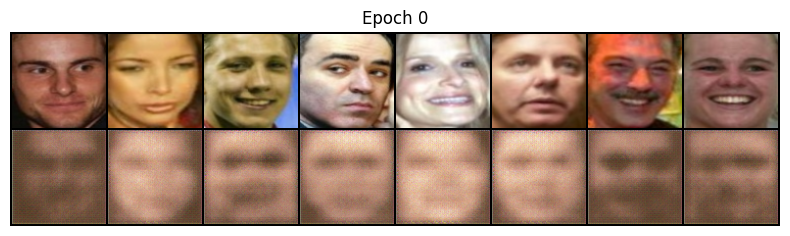

Better model found at epoch 0 with valid_loss value: -2.3509037494659424.
Better model found at epoch 1 with valid_loss value: -2.5451221466064453.
Better model found at epoch 2 with valid_loss value: -2.647550106048584.
Better model found at epoch 3 with valid_loss value: -2.710395097732544.
Better model found at epoch 4 with valid_loss value: -2.7596960067749023.
Better model found at epoch 5 with valid_loss value: -2.7782015800476074.
Better model found at epoch 6 with valid_loss value: -2.7897658348083496.
Better model found at epoch 7 with valid_loss value: -2.8206558227539062.
Better model found at epoch 8 with valid_loss value: -2.837512254714966.
Better model found at epoch 9 with valid_loss value: -2.839155912399292.


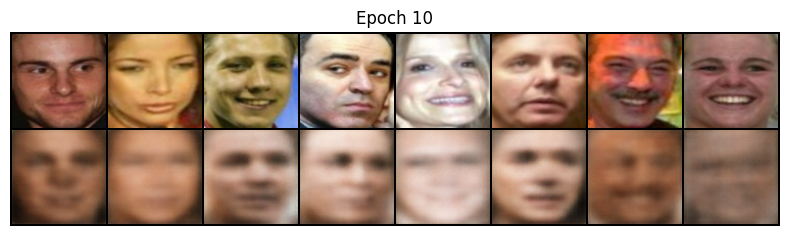

Better model found at epoch 10 with valid_loss value: -2.8540351390838623.
Better model found at epoch 11 with valid_loss value: -2.861410617828369.
Better model found at epoch 12 with valid_loss value: -2.866154193878174.
Better model found at epoch 14 with valid_loss value: -2.8857169151306152.
Better model found at epoch 16 with valid_loss value: -2.886988878250122.
Better model found at epoch 17 with valid_loss value: -2.8897080421447754.
Better model found at epoch 18 with valid_loss value: -2.891939401626587.
Better model found at epoch 19 with valid_loss value: -2.9014155864715576.


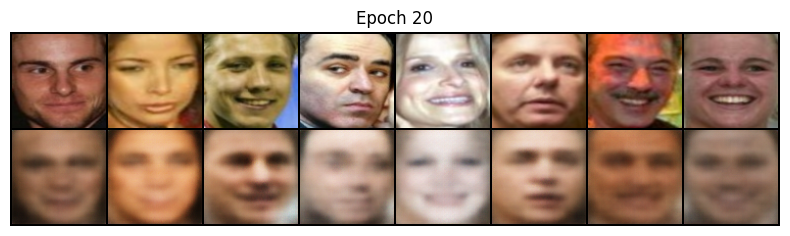

Better model found at epoch 22 with valid_loss value: -2.905075788497925.
Better model found at epoch 24 with valid_loss value: -2.9116051197052.
Better model found at epoch 28 with valid_loss value: -2.9210469722747803.


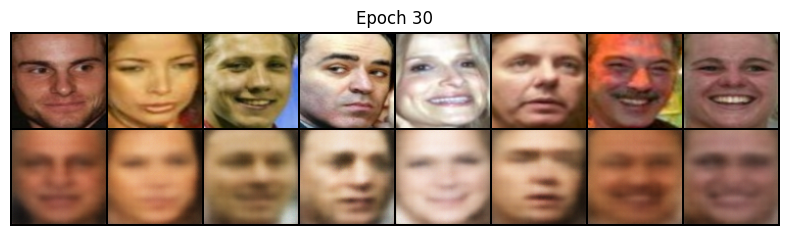

Better model found at epoch 35 with valid_loss value: -2.932441234588623.
Better model found at epoch 37 with valid_loss value: -2.9361071586608887.


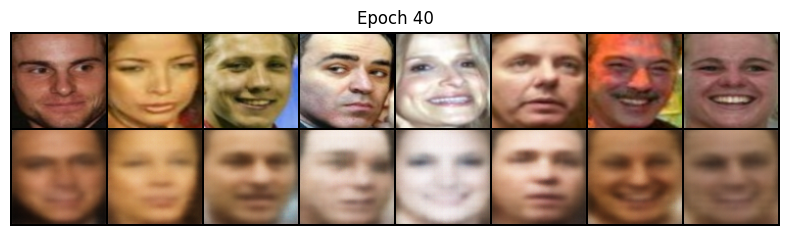

Better model found at epoch 41 with valid_loss value: -2.9385905265808105.
Better model found at epoch 42 with valid_loss value: -2.9458112716674805.
Better model found at epoch 46 with valid_loss value: -2.9557480812072754.
Better model found at epoch 49 with valid_loss value: -2.9672343730926514.


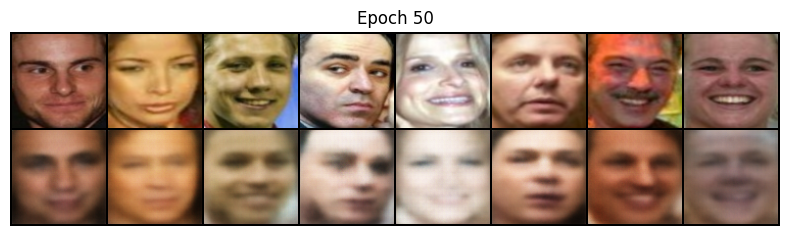

Better model found at epoch 53 with valid_loss value: -2.9678893089294434.


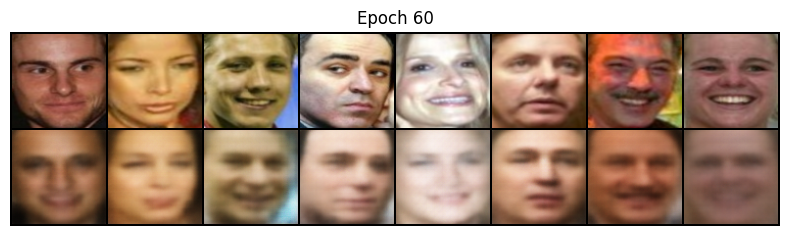

Better model found at epoch 61 with valid_loss value: -2.975897789001465.
Better model found at epoch 62 with valid_loss value: -2.9771242141723633.
Better model found at epoch 64 with valid_loss value: -2.990832805633545.


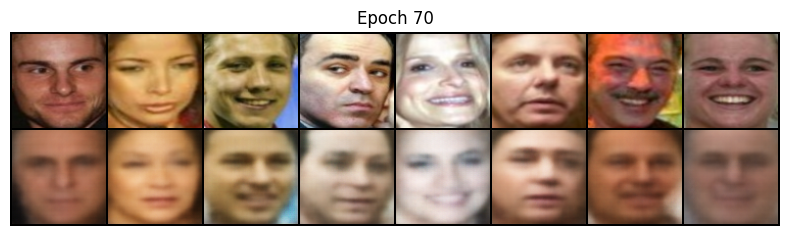

Better model found at epoch 75 with valid_loss value: -2.9926912784576416.


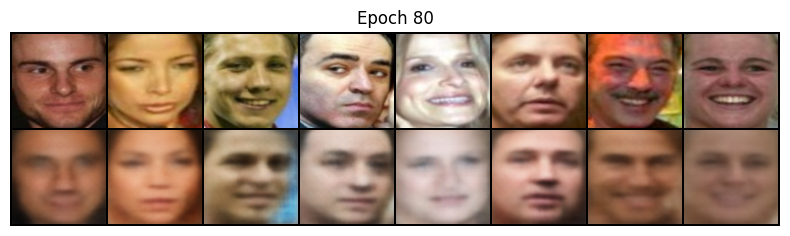

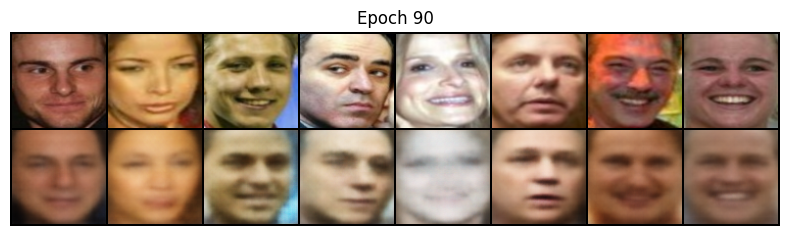

Better model found at epoch 90 with valid_loss value: -2.9961130619049072.
Better model found at epoch 93 with valid_loss value: -2.9980082511901855.


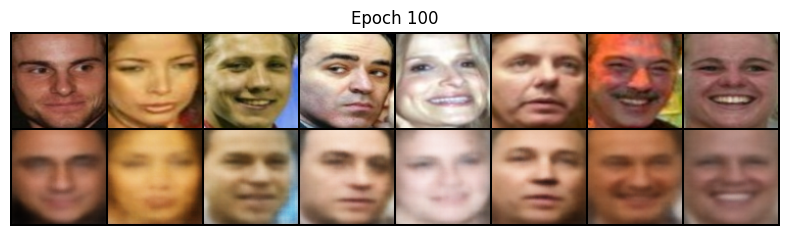

Better model found at epoch 101 with valid_loss value: -3.0019397735595703.


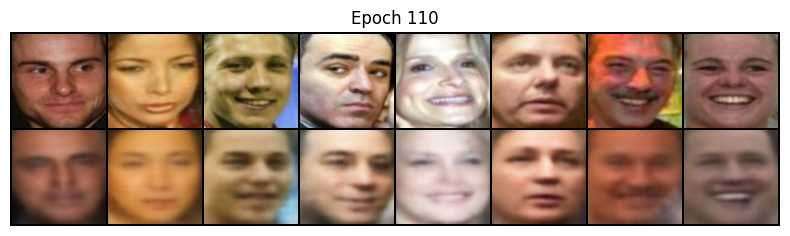

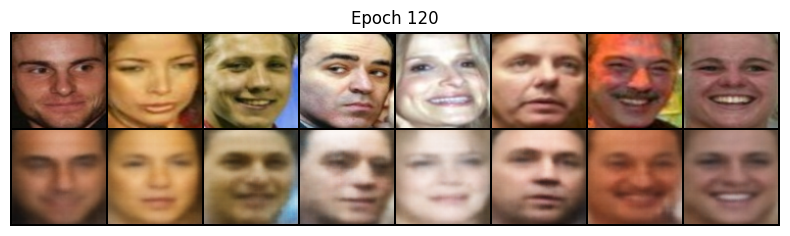

Better model found at epoch 120 with valid_loss value: -3.004978656768799.
Better model found at epoch 122 with valid_loss value: -3.006929874420166.
Better model found at epoch 123 with valid_loss value: -3.0081794261932373.


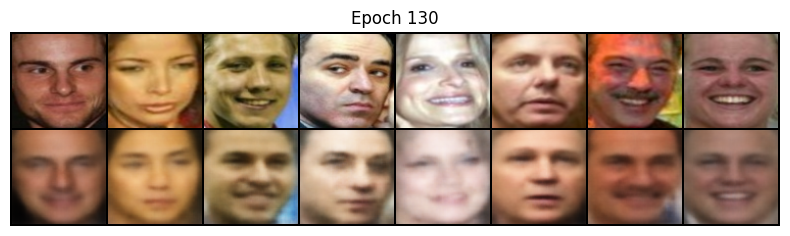

Better model found at epoch 135 with valid_loss value: -3.0087168216705322.
Better model found at epoch 139 with valid_loss value: -3.010071277618408.


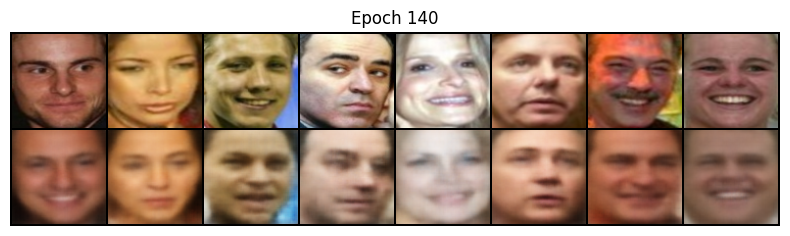

Better model found at epoch 145 with valid_loss value: -3.010286569595337.


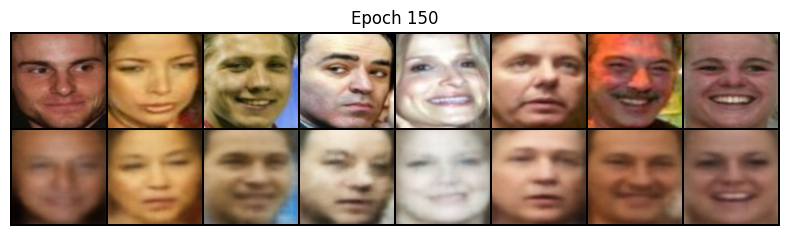

Better model found at epoch 158 with valid_loss value: -3.011294364929199.


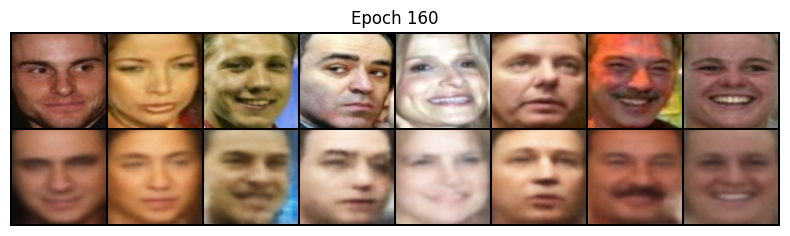

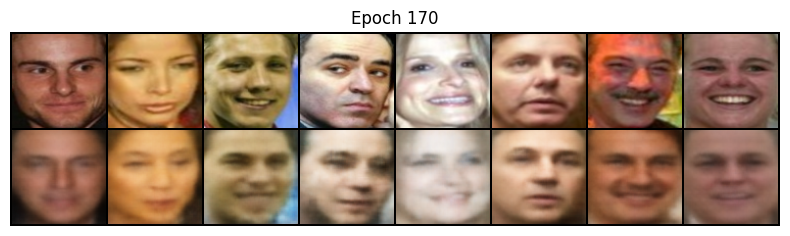

Better model found at epoch 179 with valid_loss value: -3.0126266479492188.


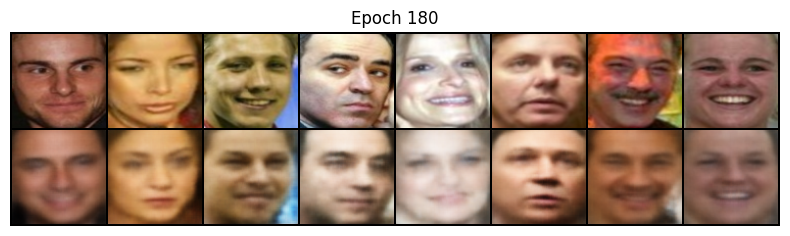

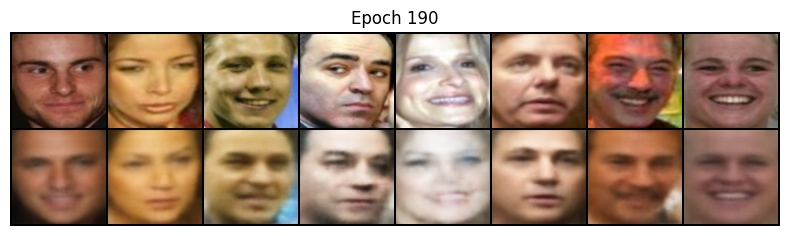

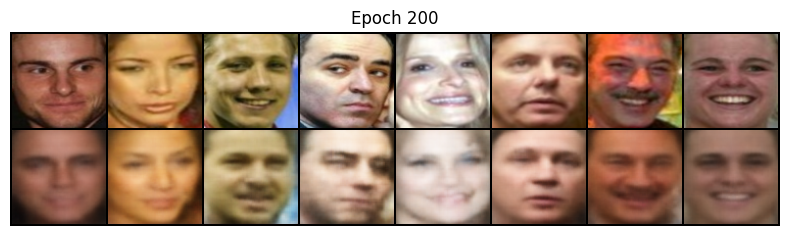

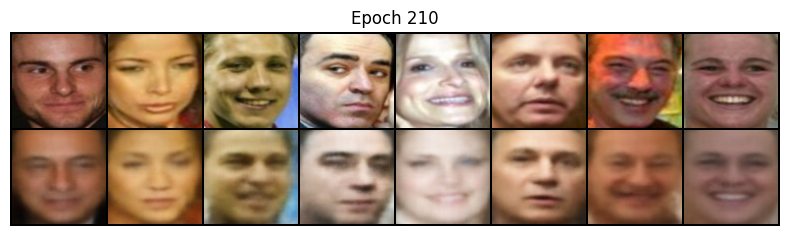

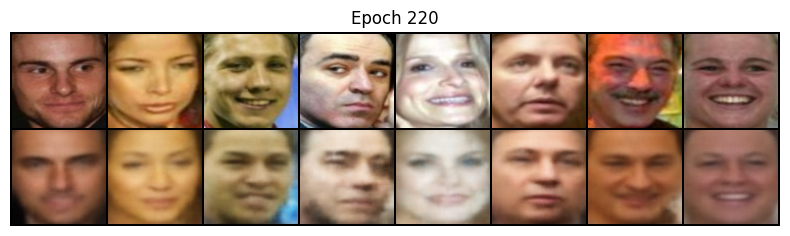

...

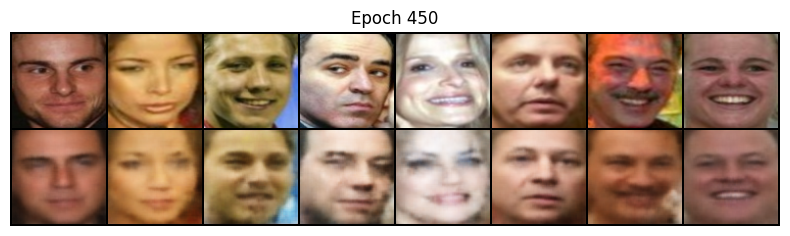

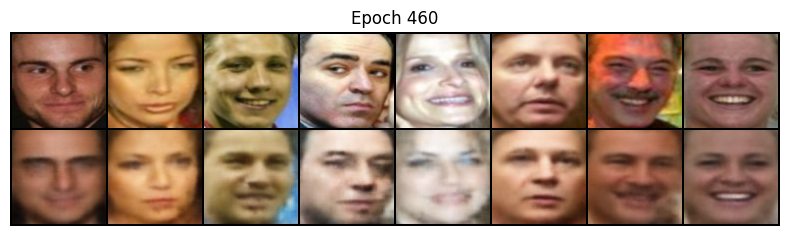

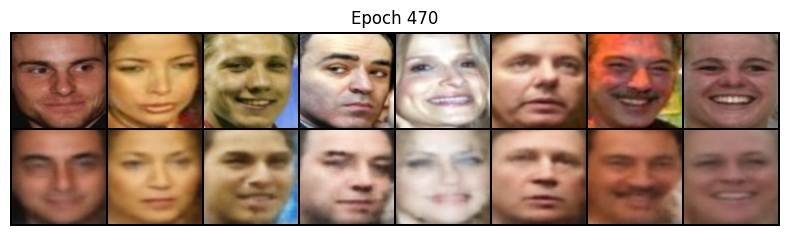

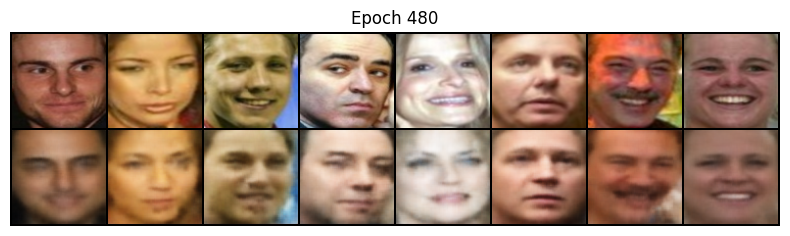

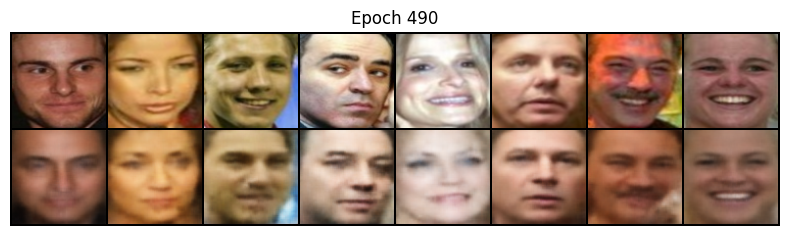

In [7]:
learn.fit_one_cycle(epochs, lr_max=lr)


## 7. Post-training analysis
Collect latent vectors, fit PCA, save metadata, and generate the final diagnostics (reconstruction grid, training curves, latent traversal).

Artifacts saved (model + PCA + metadata). Rendering diagnostics inline...


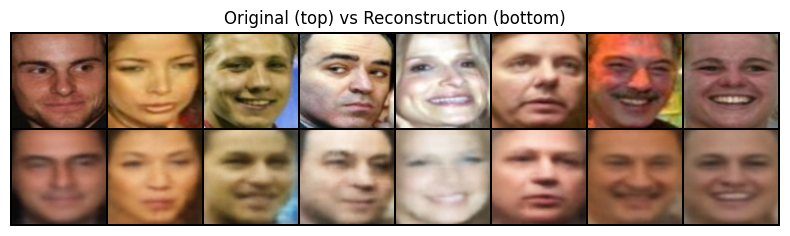

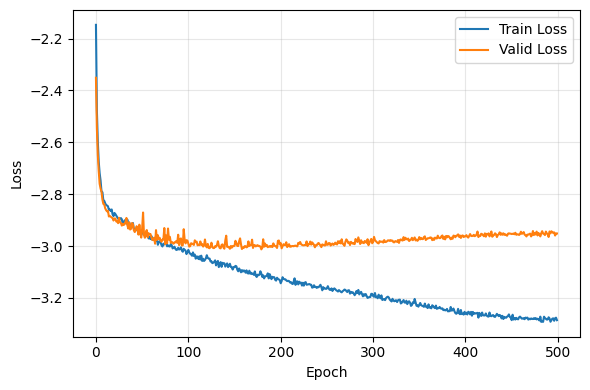

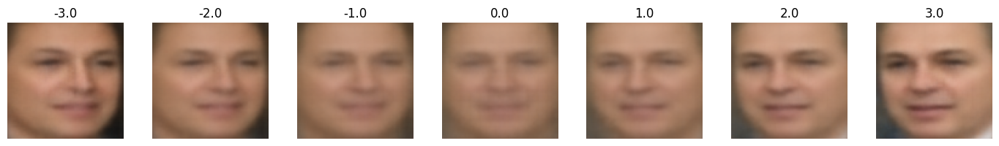

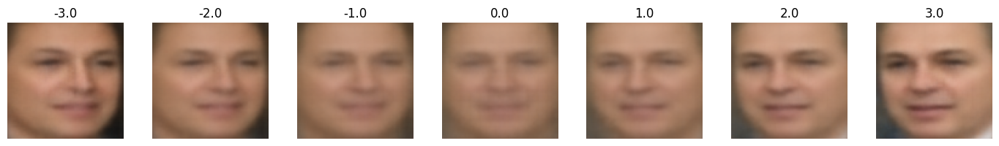

In [8]:
latents = collect_latents(learn)
latent_mean = latents.mean(axis=0)

from sklearn.decomposition import PCA
pca = PCA(n_components=pca_components)
pca.fit(latents)

pca_path = run_dir / 'pca.npz'
np.savez(
    pca_path,
    components=pca.components_,
    explained_variance=pca.explained_variance_,
    explained_variance_ratio=pca.explained_variance_ratio_,
    singular_values=pca.singular_values_,
    latent_mean=latent_mean,
    pca_mean=pca.mean_,
)

metadata = {
    'run_id': run_id,
    'epochs': epochs,
    'batch_size': batch_size,
    'latent_dim': latent_dim,
    'lr': lr,
    'beta': beta,
    'loss_type': loss_type,  # Record which loss was used
    'pca_components': pca_components,
    'seed': seed,
    'image_size': image_size,
    'lfw_resize': lfw_resize,
    'run_dir': str(run_dir),
    'model_path': str(run_dir / 'model.pth'),
    'pca_path': str(pca_path),
    'log_path': str(history_path),
    'dataset': {
        'num_samples': info.num_samples,
        'height': info.height,
        'width': info.width,
    },
}
with (run_dir / 'metadata.json').open('w') as f:
    json.dump(metadata, f, indent=2)

print('Artifacts saved (model + PCA + metadata). Rendering diagnostics inline...')

plot_reconstruction_grid(
    learn.model,
    reference_batch,
    n_samples=min(8, reference_batch.size(0)),
    title='Original (top) vs Reconstruction (bottom)',
)

plot_training_curves(history_path, smoothing=1)

plot_latent_traversal(
    learn.model,
    base_latent=latent_mean,
    component=pca.components_[0],
)


## 8. Run Summary

In [9]:
from IPython.display import Markdown

Markdown(f"""
## Run Summary

- **Run ID:** `{run_id}`
- **Loss Function:** `{loss_type}`
- **Beta (KL weight):** `{beta}`
- **Epochs:** `{epochs}`
- **Latent Dim:** `{latent_dim}`
- **Image Size:** `{image_size}x{image_size}`

All artifacts live in `{run_dir}`.

### Comparing Loss Functions

To compare different loss functions, run this notebook multiple times with different `loss_type` values:
- `'mse'`: Standard MSE (fastest, can be blurry)
- `'log_mse'`: Log(MSE) (good balance, often sharper)
- `'perceptual'`: VGG perceptual loss (best quality, slower)
- `'hybrid'`: Log(MSE) + Perceptual (recommended default - combines benefits of both)

Compare the reconstruction grids and training curves to see the differences!
""")



## Run Summary

- **Run ID:** `20251130-150833`
- **Loss Function:** `log_mse`
- **Beta (KL weight):** `1.0`
- **Epochs:** `500`
- **Latent Dim:** `64`
- **Image Size:** `96x96`

All artifacts live in `/home/aghasi/repos/pa-academy-ai-2025/projects/face_autoencoder/artifacts/20251130-150833`.

### Comparing Loss Functions

To compare different loss functions, run this notebook multiple times with different `loss_type` values:
- `'mse'`: Standard MSE (fastest, can be blurry)
- `'log_mse'`: Log(MSE) (good balance, often sharper)
- `'perceptual'`: VGG perceptual loss (best quality, slower)
- `'hybrid'`: Log(MSE) + Perceptual (recommended default - combines benefits of both)

Compare the reconstruction grids and training curves to see the differences!
